In [1]:
import pandas as pd
import numpy as np

from sklearn.decomposition import PCA

from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_mutual_info_score as ads
from sklearn.metrics import normalized_mutual_info_score as nis
from sklearn.metrics import mutual_info_score as mis
from random import randint
np.random.seed(42)

import plotly.express as px

import Levenshtein as lv

import scipy.spatial as sp, scipy.cluster.hierarchy as hc

import scipy

from scipy.cluster.hierarchy import ward, fcluster

In [2]:
import umap
import seaborn as sns; sns.set()

# Read the data

In [3]:
transformer_data = np.load("seq_repr.npz")

data = transformer_data['seq']
labels = transformer_data['ids']


In [4]:
labels

array(['Ag44', 'Ag44', 'Ag44', ..., 'Ag93', 'Ag93', 'Ag93'], dtype='<U5')

In [5]:
df = pd.read_csv("hackathon.csv", sep = "\t")

In [6]:
df

,ab_sequence,antigen,epitope,ag_ID
0,RITTVVALRYF,X2X2--X2--X2,R2F2R2D2,Ag44
1,RFTTVVAFDYW,X2X2--X2--X2,R2F2R2D2,Ag44
2,REGEKLLRLAY,X2X2--X2--X2,R2F2R2M2,Ag44
3,RRFQFITTYAM,X2X2--X2--X2,R2F2R2M2,Ag44
4,ARFPFYDSLAY,X2X2--X2--X2,R2F2R2M2,Ag44
...,...,...,...,...
233600,VRALYYGNYEF,X2--X2--X2--X2--X2--X2,H2D2R2N2H2Y2,Ag91
233601,CGLPCPWFAYW,X2--X2--X2,R2R2A2,Ag91
233602,ALLRTGWYFDV,X2--X2--X2--X2--X2--X2,H2D2R2N2H2Y2,Ag91
233603,VRIYYYGSWYF,X2--X2--X2--X2--X2--X2,H2D2R2N2H2Y2,Ag91


In [7]:
data

array([[ 1.4453901e-01, -2.6990782e-02,  1.5306403e-01, ...,
        -6.3672632e-02,  2.2582999e-01,  6.3723661e-02],
       [ 1.8407072e-01, -3.7306435e-02,  1.1165047e-01, ...,
        -1.0966589e-01,  2.3244537e-01,  4.5951925e-02],
       [ 8.2382269e-02,  4.2799011e-02,  3.3508930e-02, ...,
        -1.9185385e-01,  5.5601254e-02, -4.3583728e-02],
       ...,
       [ 1.1197631e-01, -4.8938211e-02,  9.2348211e-02, ...,
         1.3764096e-04,  1.6915500e-01, -1.6355550e-01],
       [ 1.6471668e-01, -4.1890774e-02,  9.7278714e-02, ...,
         3.0668633e-02,  2.6769233e-01, -7.3274799e-02],
       [ 1.2986706e-01,  5.9740320e-02,  5.4172732e-02, ...,
        -8.4675215e-02,  1.7583965e-01,  7.7153713e-02]], dtype=float32)

In [8]:
labels

array(['Ag44', 'Ag44', 'Ag44', ..., 'Ag93', 'Ag93', 'Ag93'], dtype='<U5')

In [9]:
data.shape

(181486, 1280)

In [10]:
labels.shape

(181486,)

In [11]:
data = pd.DataFrame(data)
data['labels'] = labels
data['ab_sequence'] = df['ab_sequence']
data['antigen'] = df['antigen']
data['epitope'] = df['epitope']



In [12]:
#data = data[data['labels'].str.contains("Ag63|Ag91")]
data.columns

Index([            0,             1,             2,             3,
                   4,             5,             6,             7,
                   8,             9,
       ...
                1274,          1275,          1276,          1277,
                1278,          1279,      'labels', 'ab_sequence',
           'antigen',     'epitope'],
      dtype='object', length=1284)

In [13]:


data = data.groupby('labels').apply(lambda x: x.sample(1000)).reset_index(drop=True)

In [14]:
labels = data['labels'].values
ab_sequence = data['ab_sequence'].values
antigen = data['antigen'].values
epitope = data['epitope'].values



#data = data.drop("labels", axis = 1)
#data = data.drop("ab_sequence", axis = 1)
#data = data.drop("antigen", axis = 1)
#data = data.drop("epitope", axis = 1)

In [15]:
labels.shape


(10000,)

In [16]:
data.shape

(10000, 1284)

In [17]:
#data = data[0:500,:]
#labels = labels[0:500]

In [18]:
cmap = plt.get_cmap('viridis')
colors  = cmap(np.linspace(0, 1, len(labels)))

In [19]:

#data = pd.concat([data, pd.get_dummies(labels)], axis=1)
#data = pd.concat([data, pd.get_dummies(epitope)], axis=1)

In [20]:
data.shape

(10000, 1284)

In [21]:
data

,0,1,2,3,4,5,6,7,8,9,...,1274,1275,1276,1277,1278,1279,labels,ab_sequence,antigen,epitope
0,0.112286,0.065091,0.030886,0.132970,-0.019748,-0.087489,0.035796,-0.125517,-0.095782,-0.029073,...,-1.071828,-0.015078,0.186998,-0.106540,0.149280,0.163525,Ag12,CARRVLLRFRY,X3--X2--X2--X2,W3D2E2I2
1,0.134750,0.084596,-0.054745,0.152513,-0.016959,-0.129646,-0.156295,-0.153707,-0.310145,-0.120919,...,-0.873920,-0.078463,0.256231,-0.026621,0.096198,-0.125532,Ag12,LGLGHEGAWFA,X2--X3--X2--X2,F2D3W2I2
2,0.034178,0.027171,0.166172,0.108287,-0.020785,-0.071990,0.029308,-0.044854,0.072678,0.042164,...,-1.354678,-0.015957,0.199524,-0.004734,0.350766,0.184301,Ag12,CAREEALLRFF,X2--X2--X2--X2X3,C2V2N2D2Y3
3,0.081803,0.048190,-0.221368,0.072234,-0.040953,-0.111371,-0.146301,-0.200028,-0.310989,-0.087086,...,-1.100212,-0.020802,0.237828,0.000692,0.200444,-0.116203,Ag12,RILLRKRGYAM,X2--X3--X2--X2--X2,F2D3W2E2I2
4,0.132639,0.048303,-0.000165,0.182310,0.058589,-0.109400,-0.098801,-0.041913,-0.071624,-0.108480,...,-1.218139,0.013685,0.162389,-0.037479,0.076893,-0.026757,Ag12,RVRLGRRHWYF,X2--X3--X2--X2--X2,F2D3W2E2I2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.104122,0.045603,0.007815,0.202637,0.007664,-0.126223,-0.186115,0.074749,-0.054406,-0.004892,...,-1.331859,-0.036555,0.131900,-0.038451,0.107464,-0.079688,Ag93,YLRTDWYFDVW,X3--X2--X2,L3M2L2
9996,0.150953,-0.024357,0.013718,0.200790,0.062050,-0.097562,-0.178132,0.010623,-0.104513,-0.082764,...,-1.257427,-0.086262,0.267372,-0.087743,0.190419,-0.052288,Ag93,VDLITTVVDYW,X2--X3--X3,N2I3Y3
9997,0.034776,0.024148,-0.180452,0.149216,-0.002681,-0.079768,-0.144567,-0.059979,-0.074673,-0.060453,...,-1.253069,-0.076477,0.221173,0.036883,0.275719,-0.089958,Ag93,ARFFYDYGYYF,X2--X3--X3,N2I3Y3
9998,0.076748,0.058315,-0.099406,0.229519,-0.127585,-0.102188,-0.176952,-0.075537,-0.167629,-0.031718,...,-1.294608,-0.116294,0.194728,-0.013026,0.088703,0.050431,Ag93,YYDYLPGIFDV,X2--X3--X3,N2I3Y3


In [22]:
ab_sequence

array(['CARRVLLRFRY', 'LGLGHEGAWFA', 'CAREEALLRFF', ..., 'ARFFYDYGYYF',
       'YYDYLPGIFDV', 'CAIITTVPRYF'], dtype=object)

# Calculate pairwise Levenshtein distances between the sequences and visualize it with UMAP (as custom distance metric)

In [23]:
distmat = np.zeros((len(ab_sequence), len(ab_sequence)))

for i in range(len(ab_sequence)):
    if i%500 == 0:
        print(i)
    for j in range(len(ab_sequence)):
        distmat[i,j] = lv.distance(ab_sequence[i],ab_sequence[j])
        
        

0
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500


In [24]:
distmat

array([[ 0., 11.,  5., ...,  9., 10.,  8.],
       [11.,  0., 10., ..., 10., 10., 11.],
       [ 5., 10.,  0., ...,  9., 11.,  7.],
       ...,
       [ 9., 10.,  9., ...,  0., 10.,  9.],
       [10., 10., 11., ..., 10.,  0., 11.],
       [ 8., 11.,  7., ...,  9., 11.,  0.]])

In [25]:
U = umap.UMAP(metric='precomputed')
XY = U.fit_transform(distmat)

C:\Users\rofra\anaconda3\envs\ipy\lib\site-packages\umap\umap_.py:1735: UserWarning:

using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data



In [26]:
df_umap = pd.DataFrame(XY, columns=['x', 'y'])
XY = pd.concat([df_umap, data], axis=1)
XY = XY.iloc[0:10000, :]
XY

,x,y,0,1,2,3,4,5,6,7,...,1274,1275,1276,1277,1278,1279,labels,ab_sequence,antigen,epitope
0,7.591439,6.107057,0.112286,0.065091,0.030886,0.132970,-0.019748,-0.087489,0.035796,-0.125517,...,-1.071828,-0.015078,0.186998,-0.106540,0.149280,0.163525,Ag12,CARRVLLRFRY,X3--X2--X2--X2,W3D2E2I2
1,6.692439,2.557337,0.134750,0.084596,-0.054745,0.152513,-0.016959,-0.129646,-0.156295,-0.153707,...,-0.873920,-0.078463,0.256231,-0.026621,0.096198,-0.125532,Ag12,LGLGHEGAWFA,X2--X3--X2--X2,F2D3W2I2
2,6.501940,7.025210,0.034178,0.027171,0.166172,0.108287,-0.020785,-0.071990,0.029308,-0.044854,...,-1.354678,-0.015957,0.199524,-0.004734,0.350766,0.184301,Ag12,CAREEALLRFF,X2--X2--X2--X2X3,C2V2N2D2Y3
3,6.237475,3.429193,0.081803,0.048190,-0.221368,0.072234,-0.040953,-0.111371,-0.146301,-0.200028,...,-1.100212,-0.020802,0.237828,0.000692,0.200444,-0.116203,Ag12,RILLRKRGYAM,X2--X3--X2--X2--X2,F2D3W2E2I2
4,3.988631,4.418419,0.132639,0.048303,-0.000165,0.182310,0.058589,-0.109400,-0.098801,-0.041913,...,-1.218139,0.013685,0.162389,-0.037479,0.076893,-0.026757,Ag12,RVRLGRRHWYF,X2--X3--X2--X2--X2,F2D3W2E2I2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,11.770817,3.727214,0.104122,0.045603,0.007815,0.202637,0.007664,-0.126223,-0.186115,0.074749,...,-1.331859,-0.036555,0.131900,-0.038451,0.107464,-0.079688,Ag93,YLRTDWYFDVW,X3--X2--X2,L3M2L2
9996,2.924344,7.485419,0.150953,-0.024357,0.013718,0.200790,0.062050,-0.097562,-0.178132,0.010623,...,-1.257427,-0.086262,0.267372,-0.087743,0.190419,-0.052288,Ag93,VDLITTVVDYW,X2--X3--X3,N2I3Y3
9997,4.259230,3.361638,0.034776,0.024148,-0.180452,0.149216,-0.002681,-0.079768,-0.144567,-0.059979,...,-1.253069,-0.076477,0.221173,0.036883,0.275719,-0.089958,Ag93,ARFFYDYGYYF,X2--X3--X3,N2I3Y3
9998,10.938282,1.476014,0.076748,0.058315,-0.099406,0.229519,-0.127585,-0.102188,-0.176952,-0.075537,...,-1.294608,-0.116294,0.194728,-0.013026,0.088703,0.050431,Ag93,YYDYLPGIFDV,X2--X3--X3,N2I3Y3


In [40]:
fig = px.scatter(XY, x='x', y='y', color='labels')
fig.layout.update(showlegend=False)
fig.write_image("umap_ESM-1b_vs_ag.png")
fig.show()

In [41]:
fig = px.scatter(XY, x='x', y='y', color='epitope')
fig.layout.update(showlegend=False)
fig.write_image("umap_ESM-1b_vs_epitope.png")
fig.show()

# Perform hierarchical and k-mean clustering on sequence distances

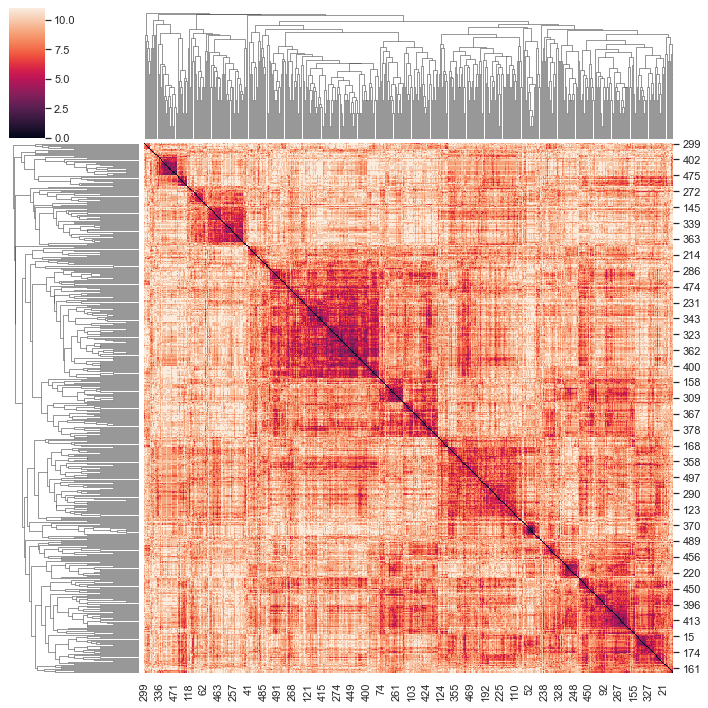

In [34]:
distmat_t = distmat[0:500, 0:500]

linkage = hc.linkage(sp.distance.squareform(distmat_t), method='average')
sns.clustermap(distmat_t, row_linkage=linkage, col_linkage=linkage)
#flights = flights.pivot("month", "year", "passengers")


In [35]:


linkage = hc.linkage(sp.distance.squareform(distmat), method='average')
#sns.clustermap(distmat, row_linkage=linkage, col_linkage=linkage)
#flights = flights.pivot("month", "year", "passengers")


In [36]:
labels_dist = fcluster(linkage, t=9, criterion='distance')
labels_dist = list(map(str,labels_dist))
XY = pd.concat([pd.DataFrame(labels_dist, columns=['labels_dist']), XY], axis=1)
XY

,labels_dist,x,y,0,1,2,3,4,5,6,...,1274,1275,1276,1277,1278,1279,labels,ab_sequence,antigen,epitope
0,12,7.591439,6.107057,0.112286,0.065091,0.030886,0.132970,-0.019748,-0.087489,0.035796,...,-1.071828,-0.015078,0.186998,-0.106540,0.149280,0.163525,Ag12,CARRVLLRFRY,X3--X2--X2--X2,W3D2E2I2
1,12,6.692439,2.557337,0.134750,0.084596,-0.054745,0.152513,-0.016959,-0.129646,-0.156295,...,-0.873920,-0.078463,0.256231,-0.026621,0.096198,-0.125532,Ag12,LGLGHEGAWFA,X2--X3--X2--X2,F2D3W2I2
2,12,6.501940,7.025210,0.034178,0.027171,0.166172,0.108287,-0.020785,-0.071990,0.029308,...,-1.354678,-0.015957,0.199524,-0.004734,0.350766,0.184301,Ag12,CAREEALLRFF,X2--X2--X2--X2X3,C2V2N2D2Y3
3,13,6.237475,3.429193,0.081803,0.048190,-0.221368,0.072234,-0.040953,-0.111371,-0.146301,...,-1.100212,-0.020802,0.237828,0.000692,0.200444,-0.116203,Ag12,RILLRKRGYAM,X2--X3--X2--X2--X2,F2D3W2E2I2
4,10,3.988631,4.418419,0.132639,0.048303,-0.000165,0.182310,0.058589,-0.109400,-0.098801,...,-1.218139,0.013685,0.162389,-0.037479,0.076893,-0.026757,Ag12,RVRLGRRHWYF,X2--X3--X2--X2--X2,F2D3W2E2I2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,6,11.770817,3.727214,0.104122,0.045603,0.007815,0.202637,0.007664,-0.126223,-0.186115,...,-1.331859,-0.036555,0.131900,-0.038451,0.107464,-0.079688,Ag93,YLRTDWYFDVW,X3--X2--X2,L3M2L2
9996,6,2.924344,7.485419,0.150953,-0.024357,0.013718,0.200790,0.062050,-0.097562,-0.178132,...,-1.257427,-0.086262,0.267372,-0.087743,0.190419,-0.052288,Ag93,VDLITTVVDYW,X2--X3--X3,N2I3Y3
9997,10,4.259230,3.361638,0.034776,0.024148,-0.180452,0.149216,-0.002681,-0.079768,-0.144567,...,-1.253069,-0.076477,0.221173,0.036883,0.275719,-0.089958,Ag93,ARFFYDYGYYF,X2--X3--X3,N2I3Y3
9998,10,10.938282,1.476014,0.076748,0.058315,-0.099406,0.229519,-0.127585,-0.102188,-0.176952,...,-1.294608,-0.116294,0.194728,-0.013026,0.088703,0.050431,Ag93,YYDYLPGIFDV,X2--X3--X3,N2I3Y3


In [37]:
#fig = px.scatter(XY, x='x', y='y', color='labels')
#fig.show()

In [42]:
fig = px.scatter(XY, x='x', y='y', color='labels_dist')
fig.layout.update(showlegend=False)
fig.write_image("umap_ESM-1b_vs_levenshtein.png")
fig.show()

# Take a quick look at the data with UMAP

In [33]:
pca = PCA(n_components=40)
fit = umap.UMAP()
x = pca.fit_transform(data)

%time u = fit.fit_transform(x)

ValueError: could not convert string to float: 'Ag12'

In [ ]:
u

In [38]:
#plt.scatter(u[:,0], u[:,1], c=colors, alpha=0.5)
#plt.title('UMAP embedding of the data');

fig = px.scatter(u, x=0, y=1, color='labels')
fig.show()

AttributeError: 'numpy.ndarray' object has no attribute 'columns'

In [35]:
fig = px.scatter(u, x=0, y=1, color=labels_dist,hover_data=[ab_sequence, antigen, epitope])
fig.show()

NameError: name 'u' is not defined

In [36]:
fig = px.scatter(u, x=0, y=1, color=epitope,hover_data=[ab_sequence, antigen, epitope])
fig.show()

NameError: name 'u' is not defined

# Visualize the data with different parameters

In [37]:
all_metrics = {}

In [40]:
def calc_metrics(u, labels):

    # clustering
    kmeans = KMeans(n_clusters=10).fit(u)
    # eval clustering
    

    #for i in zip(np.array(labels), kmeans.labels_):
    #    print(i)
    
    return([ads(np.array(labels), kmeans.labels_), nis(np.array(labels), kmeans.labels_),
           mis(np.array(labels), kmeans.labels_)])

def draw_umap(n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(x);
    fig = plt.figure()
    if n_components == 1:
        fig = px.scatter(u, x=0, y=1, color=labels,hover_data=[ab_sequence, antigen, epitope])
        fig.show()
    if n_components == 2:
        fig = px.scatter(u, x=0, y=1, color=labels,hover_data=[ab_sequence, antigen, epitope])
        fig.show()
    if n_components == 3:
        fig = px.scatter_3d(u, x=0, y=1, z = 2,color=labels,hover_data=[ab_sequence, antigen, epitope])
        fig.show()
    
    all_metrics[str(n_neighbors), str(min_dist), str(n_components), str(metric)] = calc_metrics(u, labels)
    

In [41]:
pca = PCA(n_components=40)
x = pca.fit_transform(data)
fig = px.scatter(x, x=0, y=1, color=labels,hover_data=[ab_sequence, antigen, epitope])
fig.show()


all_metrics[str("PCA"), str("PCA"), str("PCA"), str("PCA")] = calc_metrics(x, labels)

AttributeError: 'numpy.ndarray' object has no attribute 'columns'

In [42]:
pca = PCA(n_components=40)
x = pca.fit_transform(data)
fig = px.scatter(x, x=0, y=1, color=labels_dist,hover_data=[ab_sequence, antigen, epitope])
fig.show()

AttributeError: 'numpy.ndarray' object has no attribute 'columns'

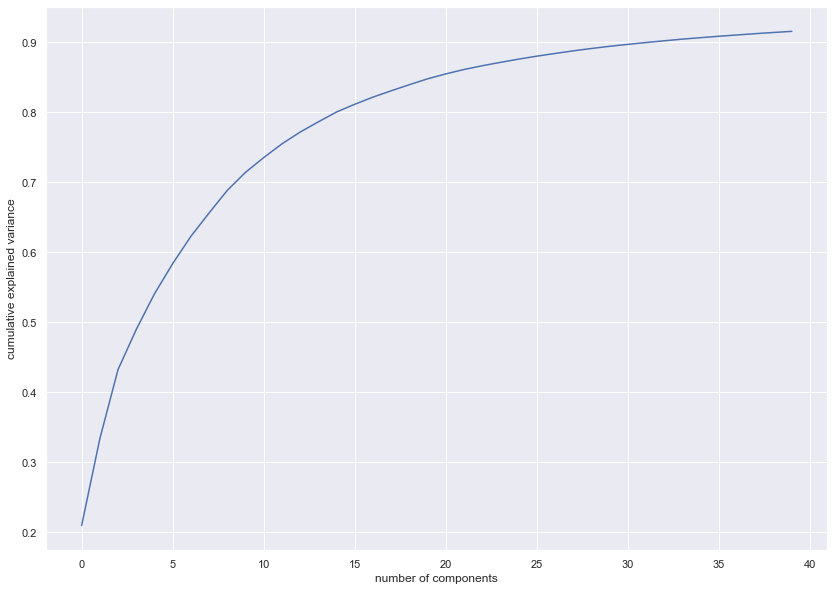

In [43]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [44]:
for n in (2, 5, 10, 20, 50, 100, 200):
    print(n)
    draw_umap(n_neighbors=n, title='n_neighbors = {}'.format(n))

2


C:\Users\rofra\anaconda3\envs\ipy\lib\site-packages\umap\spectral.py:255: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!



AttributeError: 'numpy.ndarray' object has no attribute 'columns'

<Figure size 1008x720 with 0 Axes>

In [45]:
for d in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
    draw_umap(min_dist=d, title='min_dist = {}'.format(d))

AttributeError: 'numpy.ndarray' object has no attribute 'columns'

<Figure size 1008x720 with 0 Axes>

In [42]:
for m in ("euclidean", "correlation", "manhattan", "chebyshev", "minkowski"):
    name = m if type(m) is str else m.__name__
    draw_umap(n_components=2, metric=m, title='metric = {}'.format(name))
    




<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [43]:
draw_umap(n_components=3, title='n_components = 3')

<Figure size 432x288 with 0 Axes>

In [44]:
all_metrics = pd.DataFrame(all_metrics).T
all_metrics.columns = ["adjusted_mutual_info_score", "normalized_mutual_info_score", "mutual_info_score"]

In [45]:
all_metrics


adjusted_mutual_info_score  \
PCA PCA  PCA PCA                            0.042399   
2   0.1  2   euclidean                      0.005795   
5   0.1  2   euclidean                      0.039723   
10  0.1  2   euclidean                      0.040809   
20  0.1  2   euclidean                      0.041859   
50  0.1  2   euclidean                      0.042329   
100 0.1  2   euclidean                      0.039946   
200 0.1  2   euclidean                      0.039015   
15  0.0  2   euclidean                      0.041501   
    0.1  2   euclidean                      0.041365   
    0.25 2   euclidean                      0.041631   
    0.5  2   euclidean                      0.039196   
    0.8  2   euclidean                      0.036997   
    0.99 2   euclidean                      0.038185   
    0.1  2   correlation                    0.040565   
             manhattan                      0.043939   
             chebyshev                      0.038889   
             minkowski                      0.041519   
         3   euclidean                      0.042461   

                          normalized_mutual_info_score  mutual_info_score  
PCA PCA  PCA PCA                              0.044110           0.100231  
2   0.1  2   euclidean                        0.007552           0.017351  
5   0.1  2   euclidean                        0.041459           0.093545  
10  0.1  2   euclidean                        0.042505           0.097564  
20  0.1  2   euclidean                        0.043549           0.100196  
50  0.1  2   euclidean                        0.044018           0.101280  
100 0.1  2   euclidean                        0.041639           0.095810  
200 0.1  2   euclidean                        0.040710           0.093680  
15  0.0  2   euclidean                        0.043193           0.099297  
    0.1  2   euclidean                        0.043056           0.099046  
    0.25 2   euclidean                        0.043322           0.099668  
    0.5  2   euclidean                        0.040891           0.094077  
    0.8  2   euclidean                        0.038696           0.088996  
    0.99 2   euclidean                        0.039882           0.091686  
    0.1  2   correlation                      0.042261           0.097057  
             manhattan                        0.045624           0.105005  
             chebyshev                        0.040585           0.093341  
             minkowski                        0.043211           0.099390  
         3   euclidean                        0.044153           0.101363

# Visualize the metrics